In [1]:
# Imports
import gzip
import os
from helper import *
import pandas as pd
import numpy as np
# Standard plotly imports
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)
import nltk
from nltk.probability import FreqDist
import itertools
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from sklearn.manifold import TSNE

from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
import collections
import plotly

Vocabulary constructed


Loading BokehJS ...

# Data Screening

## label2answer 

First we will start by investigating similar files that only differs in their names by 'raw' or 'token' in order to see the difference. We will first start by label2answer files.

In [2]:
# Read label2answer files, raw and token
raw_label2answer = read_data(PATH + 'InsuranceQA.label2answer.raw.encoded.gz', "label2answer")
token_label2answer = read_data(PATH + 'InsuranceQA.label2answer.token.encoded.gz', "label2answer")

Reading label2answer data. 
This data format is: <Answer Label><TAB><Answer Text> 

Reading label2answer data. 
This data format is: <Answer Label><TAB><Answer Text> 



These files contains two columns Answer labels and the answer text i.e. every answer is assigned to a number.<br>
Answers here are a list of indexes, each one of them is a key in the vocabulary dictionary. In the helper.py we defined functions that help us manipulate the indexes and map them to words.

In [3]:
# Select an example from the raw_label2answer data
' '.join(convert_from_idx_str(raw_label2answer[100][1]))

'If the primary beneficiary dies before the policy owner dies, the contingent beneficiary would be the next in line for benefits. If the policy owner is well, he or she would simply call the insurance company and request a "change of beneficiary" form and rename a new primary beneficiary. If it is the contingent who becomes primary then the owner would rename a new contingent beneficiary.'

In [4]:
# Select an example from the token_label2answer data
' '.join(convert_from_idx_str(token_label2answer[100][1]))

"If the primary beneficiary dies before the policy owner dies , the contingent beneficiary would be the next in line for benefits . If the policy owner is well , he or she would simply call the insurance company and request a `` change of beneficiary '' form and rename a new primary beneficiary . If it is the contingent who becomes primary then the owner would rename a new contingent beneficiary ."

As you can see from above the 'raw' contains the data as it's entered by the users! The 'token' one is the data processed(cleaned, word separated from punctuation) ready for vectorization i.e. ready for embedding. 

For visualisation and better manipulation of the data we will use pandas dataframes for our analysis. 

In [5]:
# dataFrame that contains the answer_labes and the answer_text 
# We will consider the data in the 'token' files
l2a = pd.DataFrame(read_data(PATH + 'InsuranceQA.label2answer.token.encoded.gz', "label2answer"), 
                                                       columns = ['answer_label', 'answer_idx'])
# to have every thing in the same dataFrame we will append the answer text to the dataframe 
l2a['answer_text'] = l2a['answer_idx'].apply(lambda a: convert_from_idx_str(a))

l2a.head()

Reading label2answer data. 
This data format is: <Answer Label><TAB><Answer Text> 



,answer_label,answer_idx,answer_text
0,1,"[idx_1, idx_2, idx_3, idx_12, idx_1305, idx_5,...","[Coverage, follows, the, car, ., Example, 1, :..."
1,2,"[idx_124, idx_107, idx_11, idx_125, idx_757, i...","[That, is, a, great, question, !, One, I, 'm, ..."
2,3,"[idx_7, idx_8, idx_77, idx_292, idx_97, idx_66...","[If, you, are, applying, for, Medicaid, ,, lif..."
3,4,"[idx_315, idx_3, idx_294, idx_20, idx_316, idx...","[Calling, the, life, insurance, company, throu..."
4,5,"[idx_76, idx_341, idx_41, idx_11, idx_342, idx...","[The, cost, of, a, Medigap, plan, is, differen..."


In the helper.py file we defined a function that convert a list of indexes to the sentence associated to it (from vocabulary dictionary).

**Stats and visualization**

In [6]:
print("The number of answers is ", len(l2a))

The number of answers is  27413


In [7]:
# Adding the length of the questions
l2a['answer_length'] = l2a['answer_text'].apply(lambda q: len(q))
l2a.head()

,answer_label,answer_idx,answer_text,answer_length
0,1,"[idx_1, idx_2, idx_3, idx_12, idx_1305, idx_5,...","[Coverage, follows, the, car, ., Example, 1, :...",235
1,2,"[idx_124, idx_107, idx_11, idx_125, idx_757, i...","[That, is, a, great, question, !, One, I, 'm, ...",424
2,3,"[idx_7, idx_8, idx_77, idx_292, idx_97, idx_66...","[If, you, are, applying, for, Medicaid, ,, lif...",71
3,4,"[idx_315, idx_3, idx_294, idx_20, idx_316, idx...","[Calling, the, life, insurance, company, throu...",66
4,5,"[idx_76, idx_341, idx_41, idx_11, idx_342, idx...","[The, cost, of, a, Medigap, plan, is, differen...",215


In [8]:
# Description of the answers_length attribute
l2a[['answer_length']].describe()

,answer_length
count,27413.000000
mean,111.826214
std,77.166811
min,16.000000
25%,67.000000
50%,87.000000
75%,125.000000
max,1335.000000


The mean of the answers length is 111.8 word! and the mean is 16, this means that the size of the answers we have is quite long. Let's investigate more it's distribution. 

In [9]:
# The distribution of the length of answers
l2a['answer_length'].iplot(kind='scatter', xTitle = 'answer', yTitle = 'length'
                                         , title='Answers length scatter plot')

From the scatter plot above it seems to be that the length of the answer is quite high. This may be due to the nature of our dataset, the answers about insurance need to be precise and well formulated in order to explain better to clients. This also can be due to the fact that collaborators are using a lot of formal expressions since they are talking to clients.

In [10]:
# The distribution of the length of answers 
l2a['answer_length'].iplot(kind='hist', xTitle='length',histnorm = 'density', 
                         yTitle='count', title='Answers length Distribution',linecolor = 'black')

The distribution is skewed to the right! This means that the mean length is bigger than the median length. Besides, the data points on the right side of the distribution are 'invisible' which tells us that they can be outliers! Let's use a box plot to see the 'suspectedoutliers' points.

In [11]:
# Box plot of the length of answres with suspectedoutliers as argument
l2a[['answer_length']].iplot(kind='box', mode='lines', boxpoints = 'suspectedoutliers')

Here from the size of the box plot we can see that we have outliers! So let's have a closer look.

In [12]:
# let's look at the questions with lenght > 1000
list(l2a[l2a['answer_length'] > 1000]['answer_text'].apply(lambda q: ' '.join(q)))[0]

'Gap insurance is a coverage that is offered either on your auto policy or through the auto finance company as an option -LRB- or requirement -RRB- on your loan . Basically , what it does is provide you a clean slate if you total a car with a loan on it . Lets look at an example : Erica buys a 2009 Volkswagon Jetta from a used car shop for $ 14,000 . The used car value could be 12,500 depending on what form you use -LRB- blackbook value , NADA , Kelly Bluebook value , etc. -RRB- The form doesnt matter here other than answering the question of is this car worth less than the loan I have on it ? Erica is required to have other-than-collision coverage -LRB- often called comprehensive coverage , which is a misnomer -RRB- and collision coverage as a stipulation for the loan she is getting with the bank or finance company . That coverage states that it will repair her car for specific reasons in the policy OR pay her the actual cash value of the car if it costs less than the repairs it would

As you can see from the example above, the insurance responses seems to be so technical sometimes so in order to make sure that the information is well transmitted to clients, collaborators uses examples and create scenarios. 

In [13]:
# Let's take an answer with small length
list(l2a[l2a['answer_length'] < 40]['answer_text'].apply(lambda q: ' '.join(q)))[0]

'Disability Insurance is paycheck protection . When you insure yourself against sickness or injury , youre valuing your ability to earn money for your family and/or business partners , who can benefit if youre unable to work .'

Other questions are straight forward so the answer is relatively short! 
<br>
However, the answer is always related to the question! So if the answer is too long it's because the question covered an important number of subjects. So let's look at the questions data.

## label2question

In [14]:
# Reading the questions files, raw and token 
raw_label2question = read_data(PATH + 'InsuranceQA.question.anslabel.raw.encoded.gz',"question.anslabel")
token_label2question = read_data(PATH + 'InsuranceQA.question.anslabel.token.encoded.gz',"question.anslabel")

Reading questions.anslabel data.
This data foramt is: <Domain><TAB><QUESTION><TAB><Groundtruth>

Reading questions.anslabel data.
This data foramt is: <Domain><TAB><QUESTION><TAB><Groundtruth>



In [15]:
raw_label2question[0]

['medicare-insurance',
 ['idx_1285', 'idx_1010', 'idx_467', 'idx_47610', 'idx_18488', 'idx_65760'],
 ['16696']]

Here the lable2question data contains in the first the position the domain of the asked question, followed by a list of indexes (again keys of words in vocabulary dictionary) and a list of ground truths which they are labels for answers. This means that a questions can have multiple answers. 

In [16]:
' '.join(convert_from_idx_str(raw_label2question[0][1]))

'What Does Medicare IME Stand For?'

In [17]:
' '.join(convert_from_idx_str(token_label2question[0][1]))

'What Does Medicare IME Stand For ?'

The same thing goes for label2question files, the 'raw' files are the questions as entered by clients and the 'token' are the one processed for machine learning purposes.

In [18]:
# Construct dataFrame for raw_label2question
l2q = pd.DataFrame(read_data(PATH + 'InsuranceQA.question.anslabel.token.encoded.gz',"question.anslabel"), 
                                               columns = ['domain', 'questions_idx', 'groundTruth_labels'])
l2q.head()

Reading questions.anslabel data.
This data foramt is: <Domain><TAB><QUESTION><TAB><Groundtruth>



,domain,questions_idx,groundTruth_labels
0,medicare-insurance,"[idx_1285, idx_1010, idx_467, idx_47610, idx_1...",[16696]
1,long-term-care-insurance,"[idx_3815, idx_604, idx_605, idx_891, idx_136,...",[10277]
2,health-insurance,"[idx_3019, idx_55039, idx_27647, idx_60975, id...",[12076]
3,medicare-insurance,"[idx_3815, idx_467, idx_34801, idx_1655, idx_7...","[25578, 6215]"
4,medicare-insurance,"[idx_1010, idx_467, idx_21593, idx_64564, idx_...",[22643]


To have a better visualization of the data we will append the plain text associated to indexes.

In [19]:
# Add the questions plain text 
l2q['questions_text'] = l2q['questions_idx'].apply(lambda q: ' '.join(convert_from_idx_str(q)))
l2q.head()

,domain,questions_idx,groundTruth_labels,questions_text
0,medicare-insurance,"[idx_1285, idx_1010, idx_467, idx_47610, idx_1...",[16696],What Does Medicare IME Stand For ?
1,long-term-care-insurance,"[idx_3815, idx_604, idx_605, idx_891, idx_136,...",[10277],Is Long Term Care Insurance Tax Free ?
2,health-insurance,"[idx_3019, idx_55039, idx_27647, idx_60975, id...",[12076],Can Husband Drop Wife From Health Insurance ?
3,medicare-insurance,"[idx_3815, idx_467, idx_34801, idx_1655, idx_7...","[25578, 6215]",Is Medicare Run By The Government ?
4,medicare-insurance,"[idx_1010, idx_467, idx_21593, idx_64564, idx_...",[22643],Does Medicare Cover Co-Pays ?


Next, we will handle groundTruth_labels with multiple values. We will explode those rows and we will duplicate the values of the remaining ones. 

In [20]:
def split_data_frame_list(df, target_column):
    """
    Splits a column with lists into rows
    
    arguments:
    df--dataframe
    target_column --name of column that contains lists        
    """
    # create a new dataframe with each item in a seperate column, dropping rows with missing values
    col_df = pd.DataFrame(df[target_column].dropna().tolist(),index=df[target_column].dropna().index)
    # create a series with columns stacked as rows         
    stacked = col_df.stack()
    return pd.DataFrame(stacked, columns=[target_column])

In [21]:
# Explode the raws that contain more than one element in the groundTruth_labels list
df_groundTruth = split_data_frame_list(l2q, 'groundTruth_labels').reset_index().drop('level_1', axis = 1)
df_groundTruth.head()

,level_0,groundTruth_labels
0,0,16696
1,1,10277
2,2,12076
3,3,25578
4,3,6215


In [22]:
# Merge the df_groundTruth withe l2q dataframe
l2q = df_groundTruth.merge(l2q, left_on = 'level_0', right_index = True).drop(['level_0'], axis = 1)
l2q.head()

,groundTruth_labels_x,domain,questions_idx,groundTruth_labels_y,questions_text
0,16696,medicare-insurance,"[idx_1285, idx_1010, idx_467, idx_47610, idx_1...",[16696],What Does Medicare IME Stand For ?
1,10277,long-term-care-insurance,"[idx_3815, idx_604, idx_605, idx_891, idx_136,...",[10277],Is Long Term Care Insurance Tax Free ?
2,12076,health-insurance,"[idx_3019, idx_55039, idx_27647, idx_60975, id...",[12076],Can Husband Drop Wife From Health Insurance ?
3,25578,medicare-insurance,"[idx_3815, idx_467, idx_34801, idx_1655, idx_7...","[25578, 6215]",Is Medicare Run By The Government ?
4,6215,medicare-insurance,"[idx_3815, idx_467, idx_34801, idx_1655, idx_7...","[25578, 6215]",Is Medicare Run By The Government ?


Now every all possible answer to a question are considered as different question answer tuple.

In [23]:
# Add the question plain text to the dataframe
l2q['groundTruth_text'] = l2q['groundTruth_labels_x'].apply(lambda t:
                                ' '.join(convert_from_idx_str(token_label2answer[int(t)-1][1])))
# Reorder the columns for better visualization
l2q = l2q[['domain', 'questions_idx', 'groundTruth_labels_y', 'groundTruth_labels_x', 
                                               'questions_text', 'groundTruth_text']]
l2q.head()

,domain,questions_idx,groundTruth_labels_y,groundTruth_labels_x,questions_text,groundTruth_text
0,medicare-insurance,"[idx_1285, idx_1010, idx_467, idx_47610, idx_1...",[16696],16696,What Does Medicare IME Stand For ?,According to the Centers for Medicare and Medi...
1,long-term-care-insurance,"[idx_3815, idx_604, idx_605, idx_891, idx_136,...",[10277],10277,Is Long Term Care Insurance Tax Free ?,"As a rule , if you buy a tax qualified long te..."
2,health-insurance,"[idx_3019, idx_55039, idx_27647, idx_60975, id...",[12076],12076,Can Husband Drop Wife From Health Insurance ?,Can a spouse drop another spouse from health i...
3,medicare-insurance,"[idx_3815, idx_467, idx_34801, idx_1655, idx_7...","[25578, 6215]",25578,Is Medicare Run By The Government ?,Medicare Part A and Part B is provided by the ...
4,medicare-insurance,"[idx_3815, idx_467, idx_34801, idx_1655, idx_7...","[25578, 6215]",6215,Is Medicare Run By The Government ?,Definitely . It is ran by the Center for Medic...


**Stats and visualization**

In [24]:
print("Number of questions is", len(l2q.groupby('questions_text').count()))

Number of questions is 16889


In [25]:
print("Number of answers used is", len(l2q))

Number of answers used is 27987


The number of answer from the label2answer is 27413 and the number of answers in label2question is 27987. This means that some answers are used multiple times, they answer multiple questions at the same time. Let's see an example of these answers.

In [26]:
# Since our dataframe contains tuples of questions and answer we need to groupby the groundTruth to find
# duplicated answers
duplicated_answers = l2q.groupby('groundTruth_text').count()[['domain']].rename(columns = {'domain': 'count'})
# Keep only duplicated raws
duplicated_answers = duplicated_answers[duplicated_answers['count']>1]

In [27]:
print("The number of duplicated answers is", len(duplicated_answers))

The number of duplicated answers is 520


In [28]:
# The distribution of the length of answers 
duplicated_answers['count'].iplot(kind='hist', xTitle='number of duplications', 
                         yTitle='count', title='distribution of duplication',linecolor = 'black')

The number of answers duplicated twice represents the majority by 485 from 520. However, there is 15 answer duplicated more than 4 times! Let's look at an example.

In [29]:
# Select rows duplicated more than 4 times
duplicated_answers = duplicated_answers[duplicated_answers['count'] > 4]
duplicated_answers.head()

,count
groundTruth_text,
"Disability insurance depends on a number of factors . The cost -LRB- your premium -RRB- is based on a number of factors - the most important being your medical history , your job , and your income - and the policies are very customizable . This is a very important type of coverage to have that many do n't think about . It protects one of your greatest assets - your ability to work.If you ca n't work because of an injury or illness , how do you provide income for you and your family . The answer ? Your disability insurance . When you 're buying a disability policy , the MOST important factor in the policy structure is the DEFINITION OF DISABILITY . Each policy will use 1 of the 3 definitions : 1 -RRB- True Own Occupation - this says you are considered totally disabled if , solely due to injury or sickness , you are not able to perform the material and substantial duties of your occupation , even if you are at work in another occupation . In short , this is the most favorable definition you can have . 2 -RRB- Modified Own Occupation - this says that you are considered totally disabled if , solely due to injury or sickness , you are not able to perform the material and substantial duties of your occupation . This one is commonly seen in many individual disability insurance policies . 3 -RRB- Gainful Occupation - this says if you are unable to perform the duties of your occupation or any occupation for which you are qualified for by education , training , or experience due to sickness or injury . In short , this is the least favorable definition . This one is commonly seen in group disability insurance policies through an employer and property and casualty insurers that offer disability coverage . There are many moving parts to disability insurance and is not something I would suggest trying to buy on your own - this is a type of coverage you should consult with an experienced independent disability insurance broker about . I hope the information is helpful - please feel free to contact me for help with your coverage and if you have any other questions . Thanks very much .",6
"Group health insurance quotes are based on the size of your business , the industrys SIC code , age of employees , and average employee health -LRB- except in Maryland , which requires no medical underwriting -RRB- . There are no instant online quotes for group health insurance for these reasons . To get a quote for group coverage , you 'll need to contact a health insurance agent - working with an independent one will allow you to shop for quotes from multiple companies in one place . I hope the information is helpful - please feel free to contact me for help with your health insurance needs and if you have any other questions . Thanks very much .",5
"It varies from person to person . Your age , where you live , if you use tobacco products , and if you qualify for a subsidy to reduce your premium will determine how much a good policy is going to cost . Under the Affordable Care Act , you have the options for bronze , silver , gold , and platinum level plans -LRB- as you go up in metal , the price goes up , but provides better benefits -RRB- - some areas also have a catastrophic plan available . In addition , your age is a big factor as well . The younger you are , the cheaper your premium - the older you are , the higher your premium . Also , if you use tobacco products , your premium can be increased up to 50 % as well . All of the plans offer good coverage . A silver or gold plan are your middle of the road type of plans because they provide strong coverage at an affordable price . I always recommend consulting with an experienced health insurance broker before you apply for anything . We can help you determine the plan that 's going to be most suitable for your needs and budget . I hope the information is helpful - please feel free to contact me for help and if you have any other questions . Thanks very much .",6
"You can apply 

Let's investigate questions associated to these answers

In [30]:
duplicated_answers.merge(l2q, left_index = True, right_on = 'groundTruth_text')[['domain', 'questions_text',
                                                                                'groundTruth_text']]

,domain,questions_text,groundTruth_text
1154,disability-insurance,How Much Does Long Term Disability Insurance C...,Disability insurance depends on a number of fa...
1783,disability-insurance,How Much Does Disability Income Insurance Cost ?,Disability insurance depends on a number of fa...
4566,disability-insurance,What Does Long Term Disability Insurance Cost ?,Disability insurance depends on a number of fa...
11187,disability-insurance,How Much Does Disability Insurance Cost Per Mo...,Disability insurance depends on a number of fa...
15063,disability-insurance,How Much Could Disability Insurance Cost ?,Disability insurance depends on a number of fa...
20094,disability-insurance,How Much Do You Pay For Disability Insurance ?,Disability insurance depends on a number of fa...
4676,health-insurance,How Much Is Health Insurance For A Small Busin...,Group health insurance quotes are based on the...
4732,health-insurance,How Much Does Group Health Insurance Cost A Sm...,Group health insurance quotes are based on the...
5579,health-insurance,Much Does Health Insurance Cost Small Business ?,Group health insurance quotes are based on the...
10906,health-insurance,How Much Does Health Insurance Cost For Small ...,Group health insurance quotes are based on the...


As you can see above the questions are 'similar' so the answer duplication is a 'normal' behavior . <br>
How Much Is It To Get Health Insurance ? <u> is the same as </u> 'How Much Does A Good Health Insurance Cost ? <br>
so 

Our data contains the domain field, so let's see the number of domains covered.

In [31]:
# Construct the domain dataFrame
domains = l2q.groupby('domain').count()[['questions_idx']].rename(columns = {'questions_idx': 'count'})
# sort count values
domains = domains.sort_values('count', ascending = False).reset_index()
domains

,domain,count
0,life-insurance,10206
1,auto-insurance,3333
2,medicare-insurance,2948
3,health-insurance,2669
4,home-insurance,2507
5,disability-insurance,1540
6,renters-insurance,1489
7,annuities,1185
8,retirement-plans,961
9,long-term-care-insurance,780


In [32]:
print("the number of domains is", len(domains))

the number of domains is 12


In [33]:
# Pie chart of the number of domains
domains.iplot(kind='pie',labels='domain',values='count',pull=.2,hole=.2,
          colorscale='blues',textposition='outside',textinfo='value+percent')

As you can observe from the pie chart the life insurance domains is the most important. It represents 36.5% of the data. Critical-illness-insurance and other-insurance represents together only 1.3 % of the data which is very small compared to the remaining domains.

Next I will see the distribution of the questions length as we did for answers length. 

In [34]:
# Groupby questions in order to eleminate duplicated question and keep only questions
questions = l2q.groupby('questions_text').count().reset_index()[['questions_text']]
# Add the length of the questions feature
questions['questions_length'] = questions['questions_text'].apply(lambda q: len(q))
questions.head()

,questions_text,questions_length
0,A Lot Of Doctors Say Medicare Is Better And Hu...,98
1,A Whole Life Policy Owner Passed Away With Cas...,135
2,A am a 20 year old single male wondering how m...,125
3,About How Much Does Auto Insurance Cost ?,41
4,About How Much Does Car Insurance Cost For A 1...,58


In [35]:
# The distribution of the length of questions 
questions['questions_length'].iplot(kind = 'scatter', xTitle = 'question', yTitle = 'length',
                                     mode = 'markers' , title='Questions length scatter plot')

The length of the questions is smaller than the length of answer. This is kind of normal since collaborators develop answers to make it clear for the client.  

In [36]:
# The distribution of the length of questions 
questions['questions_length'].iplot(kind='hist', xTitle='length',histnorm = 'density', 
                         yTitle='count', title='Questions length Distribution',linecolor = 'black')

The distribution of the answers is similar to the questions distribution! Which is something we expected, long questions demand detailed answer. 

##  anslabel

In [37]:
raw_anslabel = read_data(PATH + 'InsuranceQA.question.anslabel.raw.100.pool.solr.test.encoded.gz', "anslabel")
token_anslabel = read_data(PATH + 'InsuranceQA.question.anslabel.token.100.pool.solr.test.encoded.gz', "anslabel")

Reading Train/Test/Validation file.
This data format is: <Domain><TAB><QUESTION><TAB><Groundtruth><TAB><Pool>

Reading Train/Test/Validation file.
This data format is: <Domain><TAB><QUESTION><TAB><Groundtruth><TAB><Pool>



These files are composed from domain, question followed by groundtruth selected from a answers in the pool. The pool size is the defined by the number of possible answers. In our case we selected pool size equal to 100. <br>
At this level the questions and the answers are indexes(keys in vocabulary dictionary) and labels(index in label2answer). Pool includes ground_truth and also randomly selected negative answers.

In [38]:
# Read the file in a dataframe
raw_al = pd.DataFrame(token_anslabel, columns = ['domain', 'Questions', 'groundTruth', 'pool'])

raw_al.head()

,domain,Questions,groundTruth,pool
0,life-insurance,"[idx_1285, idx_65774, idx_862, idx_605, idx_44...","[16164, 99, 26337]","[15813, 3286, 22367, 21353, 4977, 6406, 24335,..."
1,renters-insurance,"[idx_1285, idx_1010, idx_999, idx_136, idx_215...","[22542, 4380]","[2235, 26739, 24916, 17855, 3406, 21201, 70, 1..."
2,home-insurance,"[idx_1010, idx_17002, idx_382, idx_65840, idx_...",[26439],"[23486, 2424, 14974, 3344, 7712, 6220, 5346, 1..."
3,long-term-care-insurance,"[idx_1285, idx_239, idx_49, idx_739, idx_31, i...",[6996],"[17044, 11643, 1904, 25722, 17842, 12460, 2036..."
4,medicare-insurance,"[idx_2363, idx_467, idx_8080, idx_31, idx_9966...",[9128],"[9128, 13322, 21601, 21471, 6442, 5412, 24861,..."


This data is for training models, it's the same as the one constructed in label2quetion part so no further analysis are carried.

# NLTK Analysis

## label2answer

In [39]:
def fdist(words):
    '''
    This function creates the frequnce distance 
    
    arguments:
    words--list of sentences
    '''
    # Construct the frequency distance matrix
    return FreqDist(words)

In [40]:
# Construct the frequence distance
fdist_answer = fdist(list(itertools.chain(*l2a['answer_text'])))
# top 10 most common words
fdist_answer.most_common(10)

[('.', 139684),
 ('the', 118953),
 (',', 98192),
 ('to', 80357),
 ('a', 73161),
 ('you', 69899),
 ('of', 56556),
 ('is', 53402),
 ('and', 52711),
 ('insurance', 42609)]

'insurance' appears at the 10th position, this is a very high position because it's ranked with the stopwords.

In [41]:
# Plot the curve of words frequency
def freq_plot(freq, samples):
    '''
    This function take the frequency distance matrix
    and plots the most common number of samples
    
    arguments: 
    freq--the frequency matrix
    samples--number of sample to plot
    '''
    plt.figure(figsize=(15,6))
    plt.title('Word frequency')
    plt.xlabel('word')
    freq.plot(samples, cumulative = False)
    plt.show()

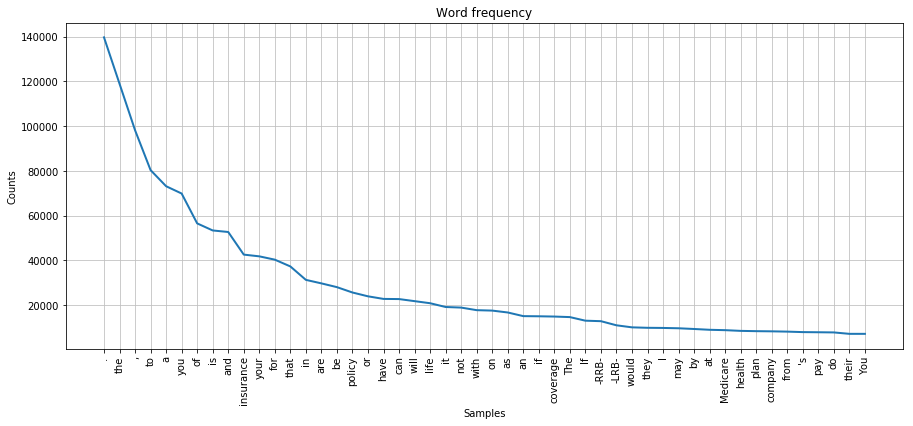

In [42]:
freq_plot(fdist_answer, 50)

The curve of the words frequency decreases exponentially.

Stopwords considered as noise in the text. Text may contain stop words such as is, am, are, this, a, an, the, etc. So let's remove them.

In [43]:
from nltk.tokenize import word_tokenize
import copy 
  
# Download stop words
stop_words = set(stopwords.words("english"))
# Define a function to remove stopwords
def remove_stopwords(tokenized_sent, stop_words = list(stop_words), flatten_sentences = True):
    '''
    This function removes stopwords from sentences
    
    arguments: 
    tokenized_sent--list of tokenized words
    stop_words--list of stopwrods (here downloaded from nltk)
    flatten_sentences--when it's a list of sentences flatten it 
    '''
    filtered_sent = []
    if flatten_sentences:
        tokenized_sent = list(itertools.chain(*tokenized_sent))
    for w in tokenized_sent:
        # Check lower case since stop words are lowercased 
        w_l = copy.copy(w).lower()
        if w_l not in stop_words:
            filtered_sent.append(w)
    return filtered_sent

In [44]:
# Create a filtred list of answers words (no stopwords)
filtered_sent_answer = remove_stopwords(list(l2a['answer_text']))

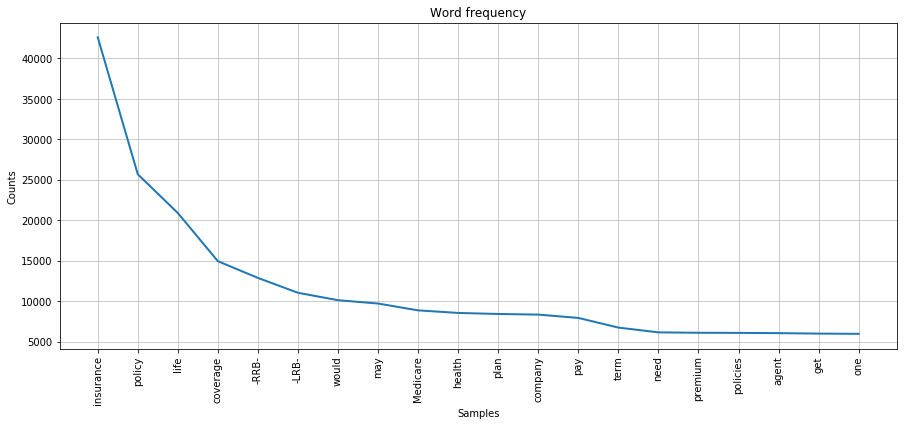

In [45]:
# Plot the most common words (We selected words with than 2 char to avoid punctuation)
freq_plot(fdist([l for l in filtered_sent_answer if len(l)>2]),20)

Stemming is a process of linguistic normalization, which reduces words to their word root word or chops off the derivational affixes. For example, connection, connected, connecting word reduce to a common word "connect".<br>
This may helps us understand better the words used in our insurance data.

In [46]:
# Create the stemmer
ps = PorterStemmer()

def stemm(filtered_sent):
    '''
    This function transform the words to their word root
    
    arguments:
    filtred_sent--a list of words (in our case it's without stopwords)
    '''
    stemmed_words=[]
    for w in filtered_sent:
        stemmed_words.append(ps.stem(w))
    return stemmed_words

In [47]:
# Create the stemmed list of words
stemmed_words_answer = stemm(filtered_sent_answer)

## label2question

In [48]:
# Construct the frequence distance from a list of words
fdist_question = fdist(list(itertools.chain(*l2q['questions_text'].apply(lambda q: q.split(' ')))))
# top 10 most common words
fdist_question.most_common(10)

[('?', 27955),
 ('Insurance', 22794),
 ('Life', 10164),
 ('Is', 7549),
 ('Does', 7119),
 ('What', 6334),
 ('A', 5805),
 ('How', 5691),
 ('Can', 4772),
 ('I', 4414)]

Again the insurance words is in a good position but it's too much lower than in the answers case! However we can notice that the question terms are the most common.

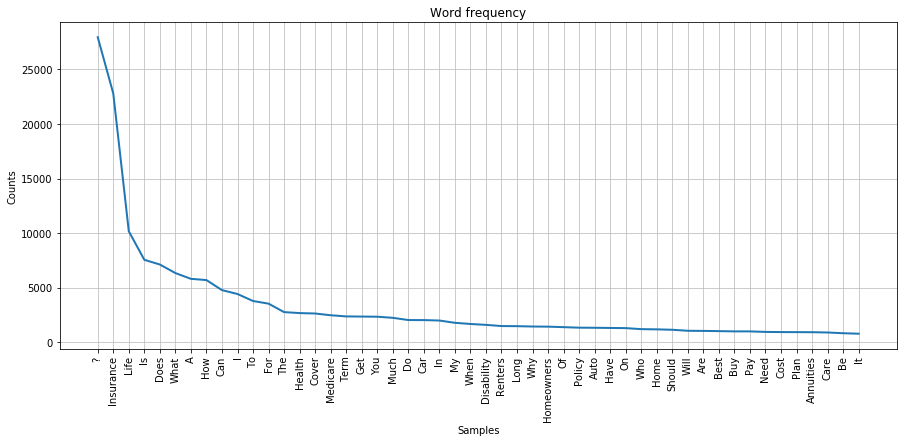

In [49]:
freq_plot(fdist_question, 50)

In [50]:
# Create a filtred list of answers words (no stopwords)
filtered_sent_questions = remove_stopwords(list(l2q['questions_text'].apply(lambda q: q.split(' '))))

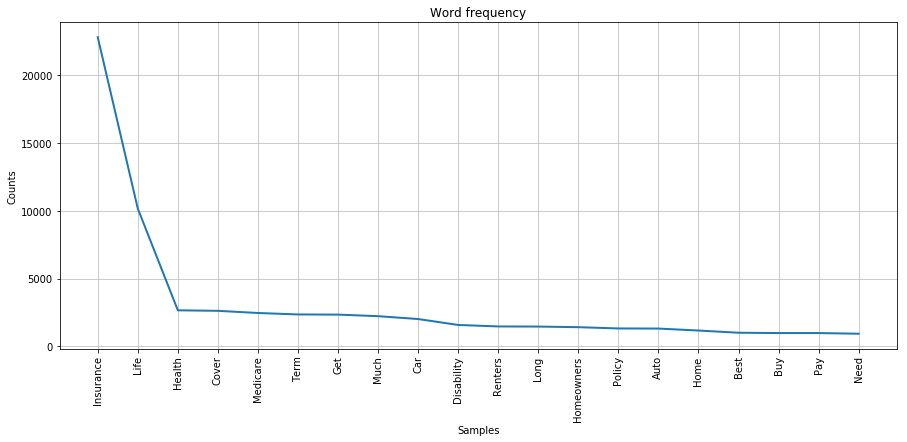

In [51]:
# Plot the most common words (We selected words with than 1 char to avoid punctuation)
freq_plot(fdist([l for l in filtered_sent_questions if len(l)>1]),20)

## POS Tagging

In [52]:
# Answer words
answer_words = list(itertools.chain(*l2a['answer_text']))
# Question words
question_words = list(itertools.chain(*l2q['questions_text'].apply(lambda q: q.split(' '))))

In [53]:
# Construct answer pos tags
answer_pos_tag = nltk.pos_tag(answer_words, tagset = 'universal')
# Construct question pos tags
question_pos_tag = nltk.pos_tag(question_words, tagset = 'universal')

In [54]:
# Construct dataframe from tags
answer_pos_tag = pd.DataFrame(answer_pos_tag, columns = ['words', 'tag'])
question_pos_tag = pd.DataFrame(question_pos_tag, columns = ['words', 'tag'])

In [55]:
# pie chart of the distirbution of tags
answer_pos_tag.groupby('tag').count().sort_values('words', ascending = False).reset_index().\
iplot(kind='pie',labels='tag',values='words',pull=.1,hole=.2,
          colorscale='blues',textposition='outside',textinfo='value+percent')

In [56]:
question_pos_tag.groupby('tag').count().sort_values('words', ascending = False).reset_index().\
iplot(kind='pie',labels='tag',values='words',pull=.2,hole=.2,
          colorscale='reds',textposition='outside',textinfo='value+percent')

For both questions and answers noun and verb are the most frequent tags. However, for questions it represents 51% of the words. 

# Semantic Analytics

## polarity analyis

In [57]:
from textblob import TextBlob, Word, Blobber
# Add polarity to label2question
l2q['polarity'] = l2q['questions_text'].map(lambda text: TextBlob(text).sentiment.polarity)
# Add polarity to label2answer 
l2a['polarity'] = l2a['answer_text'].apply(lambda a: ' '.join(a)).\
                            map(lambda text: TextBlob(text).sentiment.polarity)

In [58]:
l2q['polarity'].iplot(kind = 'hist', bins = 50, xTitle = 'polarity',linecolor = 'black', yTitle = 'count', 
                      title = 'Sentiment Polarity Distribution')

For the questions the polarity is concentrated around 0, this means that client does not fear asking questions! Or maybe than don't want to transmit their frustration the collaborator.

In [59]:
l2a['polarity'].iplot(kind = 'hist', bins = 50, xTitle = 'polarity',linecolor = 'black', yTitle = 'count', 
                      title = 'Sentiment Polarity Distribution')

In the other hand, answers are more skewed to the positive polarity part. This is kind of good since collaborators transmit their enthusiasm.  

## LSA and TSNE

In [60]:
n_topics = 6

In [62]:
def lsa(sentences, lsa_model):
    '''
    This function creates the lsa matrix, document term matrix anf tfidf vectorizer
    '''
    
    reindexed_data = sentences
    tfidf_vectorizer = TfidfVectorizer(stop_words = 'english', use_idf = True, smooth_idf = True)
    reindexed_data = reindexed_data.values
    document_term_matrix = tfidf_vectorizer.fit_transform(reindexed_data)
    lsa_topic_matrix = lsa_model.fit_transform(document_term_matrix)
    return lsa_topic_matrix, document_term_matrix,tfidf_vectorizer

In [63]:
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    
    keys = topic_matrix.argmax(axis = 1).tolist()
    return keys

In [64]:
def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    
    count_pairs = collections.Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [65]:
def get_top_n_words(n, keys, document_term_matrix, tfidf_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
        topic_words = []
        for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = tfidf_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
        top_words.append(" ".join(topic_words))         
    return top_words

In [82]:
def plot_topics(nb_word,  lsa_keys, document_term_matrix, tfidf_vectorizer, title):
    '''
    This function will plot a histogram of topics
    '''
    
    top_words = get_top_n_words(nb_word, lsa_keys, document_term_matrix, tfidf_vectorizer)
    labels = ['Topic {}: \n'.format(i) + top_words[i] for i in lsa_categories]
    fig, ax = plt.subplots(figsize = (20,8))
    ax.bar(lsa_categories, lsa_counts)
    ax.set_xticks(lsa_categories)
    ax.set_xticklabels(labels)
    ax.set_ylabel('Count')
    ax.set_title(title)
    plt.show()

In [87]:
def run_LSA(n_topics, sentences,title, nb_word_topic = 5, nb_word_plot = 3):
    '''
    This function will create an LSA model a plot the topic histogram 
    
    Arguments:
    n_topics--number of topics
    sentences--list of sentences
    nb_word_topic--number of word per topic printed
    nb_word_plot--number of world per topic plotted
    '''
    
    # Created the TruncatedSVD model
    lsa_model = TruncatedSVD(n_components = n_topics)
    # Lsa model for the answer dataframe
    lsa_topic_matrix, document_term_matrix, tfidf_vectorizer = lsa(sentences, lsa_model)
    # Get the keys
    lsa_keys = get_keys(lsa_topic_matrix)
    # Get categories along with their counts
    lsa_categories, lsa_counts = keys_to_counts(lsa_keys)
    # Select number of words to define the topics
    top_n_words_lsa = get_top_n_words(nb_word_topic, lsa_keys, document_term_matrix, tfidf_vectorizer)

    for i in range(len(top_n_words_lsa)):
        print("Words characterizing topic {}: ".format(i+1), top_n_words_lsa[i])
    # Visualize topics
    plot_topics(nb_word_plot,  lsa_keys, document_term_matrix, tfidf_vectorizer, title)
    return lsa_topic_matrix, document_term_matrix, tfidf_vectorizer, lsa_keys

Words characterizing topic 1:  insurance life policy term health
Words characterizing topic 2:  medicare plan medigap plans rrb
Words characterizing topic 3:  coverage policy property damage car
Words characterizing topic 4:  disability care term long insurance
Words characterizing topic 5:  care long term nursing home
Words characterizing topic 6:  disability income tax annuity annuities


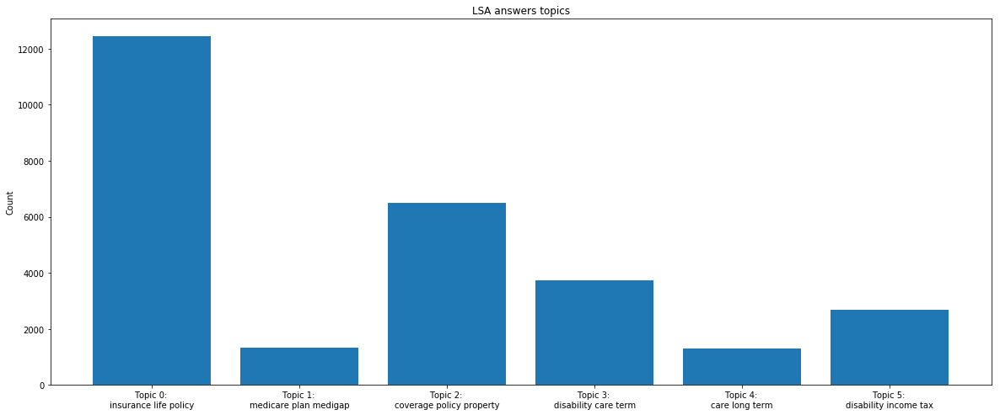

In [124]:
lsa_topic_matrix_a, document_term_matrix_a, tfidf_vectorizer_a, lsa_keys_a = \
            run_LSA(6, l2a['answers_text_no_stopWords'],'LSA answers topics')

Words characterizing topic 1:  life insurance policy term buy
Words characterizing topic 2:  long term care insurance disability
Words characterizing topic 3:  insurance health renters cover homeowners
Words characterizing topic 4:  medicare plan retirement medigap pay
Words characterizing topic 5:  disability annuities insurance buy annuity
Words characterizing topic 6:  car insurance drive affect need


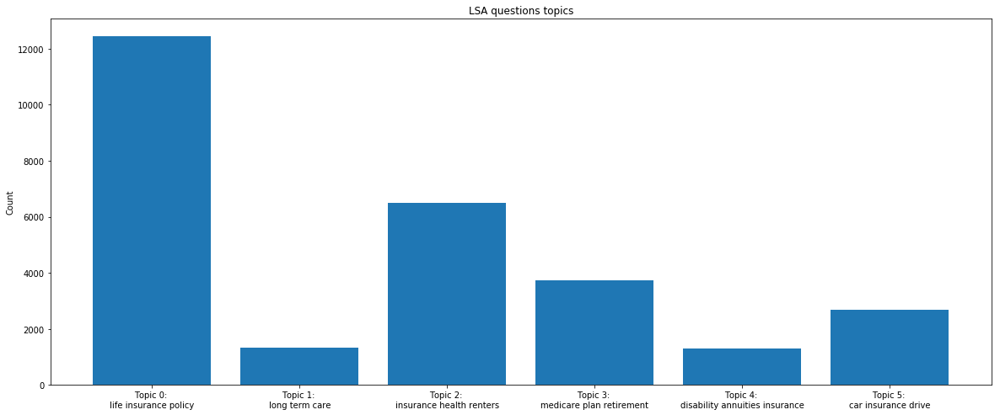

In [125]:
lsa_topic_matrix_q, document_term_matrix_q, tfidf_vectorizer_q, lsa_keys_q = \
            run_LSA(6, l2q['questions_text_no_stopWords'],'LSA questions topics')

In both answer and question dataframes the life insurance policy are the most mentioned topic. However, other topics are somehow related(if we plot more words per topic) but still no direct correlation. 

**TSNE clusters**

In [126]:
def create_model_lsa_tsne(lsa_topic_matrix):
    '''
    This function will create tsne_lsa_vector 
    
    Arguments:
    lsa_topic_matrix
    '''
    # compute tsne lsa model
    tsne_lsa_model = TSNE(n_components = 2, perplexity = 50, learning_rate = 100, 
                            n_iter = 2000, verbose = 1, random_state = 0, angle = 0.75)
    # retrieve tsne lsa vectors for answers
    tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)
    return tsne_lsa_vectors

In [127]:
# Compute tsne_lsa_vectors for questions
tsne_lsa_vectors_q = create_model_lsa_tsne(lsa_topic_matrix_q)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 27987 samples in 0.014s...
[t-SNE] Computed neighbors for 27987 samples in 1.315s...
[t-SNE] Computed conditional probabilities for sample 1000 / 27987
[t-SNE] Computed conditional probabilities for sample 2000 / 27987
[t-SNE] Computed conditional probabilities for sample 3000 / 27987
[t-SNE] Computed conditional probabilities for sample 4000 / 27987
[t-SNE] Computed conditional probabilities for sample 5000 / 27987
[t-SNE] Computed conditional probabilities for sample 6000 / 27987
[t-SNE] Computed conditional probabilities for sample 7000 / 27987
[t-SNE] Computed conditional probabilities for sample 8000 / 27987
[t-SNE] Computed conditional probabilities for sample 9000 / 27987
[t-SNE] Computed conditional probabilities for sample 10000 / 27987
[t-SNE] Computed conditional probabilities for sample 11000 / 27987
[t-SNE] Computed conditional probabilities for sample 12000 / 27987
[t-SNE] Computed conditional probabilities for sa

In [141]:
# Compute tsne_lsa_vectors for answers
tsne_lsa_vectors_a = create_model_lsa_tsne(lsa_topic_matrix_a)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 27413 samples in 0.013s...
[t-SNE] Computed neighbors for 27413 samples in 2.232s...
[t-SNE] Computed conditional probabilities for sample 1000 / 27413
[t-SNE] Computed conditional probabilities for sample 2000 / 27413
[t-SNE] Computed conditional probabilities for sample 3000 / 27413
[t-SNE] Computed conditional probabilities for sample 4000 / 27413
[t-SNE] Computed conditional probabilities for sample 5000 / 27413
[t-SNE] Computed conditional probabilities for sample 6000 / 27413
[t-SNE] Computed conditional probabilities for sample 7000 / 27413
[t-SNE] Computed conditional probabilities for sample 8000 / 27413
[t-SNE] Computed conditional probabilities for sample 9000 / 27413
[t-SNE] Computed conditional probabilities for sample 10000 / 27413
[t-SNE] Computed conditional probabilities for sample 11000 / 27413
[t-SNE] Computed conditional probabilities for sample 12000 / 27413
[t-SNE] Computed conditional probabilities for sa

In [128]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [129]:
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [158]:
def cluster_bokeh_tsne(lsa_keys, document_term_matrix, tfidf_vectorizer, tsne_lsa_vectors, title ):
    '''
    This function will plot the cluster with bokeh library
    '''
    top_3_words_lsa = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)
    lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

    plot = figure(title="t-SNE "+ title  + " Clustering of {} ".format(n_topics) +"  LSA Topics", plot_width=700, plot_height=700)
    plot.scatter(x = tsne_lsa_vectors[:,0], y = tsne_lsa_vectors[:,1], color = colormap[lsa_keys])

    for t in range(n_topics):
        label = Label(x = lsa_mean_topic_vectors[t][0], y = lsa_mean_topic_vectors[t][1], 
                      text = top_3_words_lsa[t], text_color = colormap[t])
        plot.add_layout(label)
        
    show(plot)

In [166]:
def cluster_plotly_tsne(tsne_lsa_vectors,lsa_mean_topic_vectors,lsa_keys,\
                        document_term_matrix, tfidf_vectorizer, title):
    '''
    This function will plot the clusters with plotly library
    '''
    trace1 = go.Scattergl(
            x = np.array(tsne_lsa_vectors[:,0]),
            y = np.array(tsne_lsa_vectors[:,1]),
            mode = 'markers', marker = dict(size = 5,color = colormap[lsa_keys]))
    top_3_words_lsa = get_top_n_words(3, lsa_keys, document_term_matrix, tfidf_vectorizer)
    
    for t in range(n_topics):
        trace2 = go.Scatter(
            x = np.array(list(zip(*lsa_mean_topic_vectors))[0]),
            y = np.array(list(zip(*lsa_mean_topic_vectors))[1]),
            mode = 'markers+text',
            text = np.array(top_3_words_lsa[0:n_topics]),
            textfont = dict(
            family = 'sans serif',
            size = 15,
            color = colormap[0:n_topics]))

    data = [trace1,trace2]
    
    layout = go.Layout(title = "t-SNE "+ title + " Clustering of {} ".format(n_topics) +"  LSA Topics",
             margin = dict(l = 0, r = 0, b = 0, t = 0))
    fig = go.Figure(data = data, layout = layout)
    plotly.offline.iplot(fig)

**Questions plots**

In [160]:
cluster_bokeh_tsne(lsa_keys_q, document_term_matrix_q, tfidf_vectorizer_q, tsne_lsa_vectors_q, 'Questions')

In [173]:
cluster_plotly_tsne(tsne_lsa_vectors_q,get_mean_topic_vectors(lsa_keys_q, tsne_lsa_vectors_q),\
                    lsa_keys_q, document_term_matrix_q, tfidf_vectorizer_q, 'Questions')

It's looks like that we have some clusters but nothing solid to interpret for now.

**Answers plot**

In [167]:
cluster_bokeh_tsne(lsa_keys_a, document_term_matrix_a, tfidf_vectorizer_a, tsne_lsa_vectors_a, 'Answers')

In [174]:
cluster_plotly_tsne(tsne_lsa_vectors_a, get_mean_topic_vectors(lsa_keys_a, tsne_lsa_vectors_a),\
                    lsa_keys_a, document_term_matrix_a, tfidf_vectorizer_a, 'Answers')

With tnse on top of LSA, the answers seem to have separated topics but for the questions it's not clear if we have real separation between clusters so let's try with LDA analysis.

## LDA and TSNE

In [188]:
from sklearn.decomposition import LatentDirichletAllocation

In [189]:
def create_model_lda_tsne(document_term_matrix):
    lda_model = LatentDirichletAllocation(n_components=n_topics, learning_method='online', 
                                          random_state=0, verbose=0)
    lda_topic_matrix = lda_model.fit_transform(document_term_matrix)
    return lda_topic_matrix

In [204]:
def lda_topics(lda_topic_matrix, document_term_matrix, tfidf_vectorizer,title, \
               nb_word_topic = 5, nb_word_plot = 3):
    lda_keys = get_keys(lda_topic_matrix)
    lda_categories, lda_counts = keys_to_counts(lda_keys)
    top_n_words_lda = get_top_n_words(3, lda_keys, document_term_matrix, tfidf_vectorizer)

    for i in range(len(top_n_words_lda)):
        print("Topic {}: ".format(i+1), top_n_words_lda[i])
    
    plot_topics(nb_word_plot, lda_keys, document_term_matrix, tfidf_vectorizer, title)
    

Topic 1:  life insurance policy
Topic 2:  medicare nursing care
Topic 3:  medicare shoes inserts
Topic 4:  insurance medicare coverage
Topic 5:  india forge valley
Topic 6:  usaa stonebridge halley


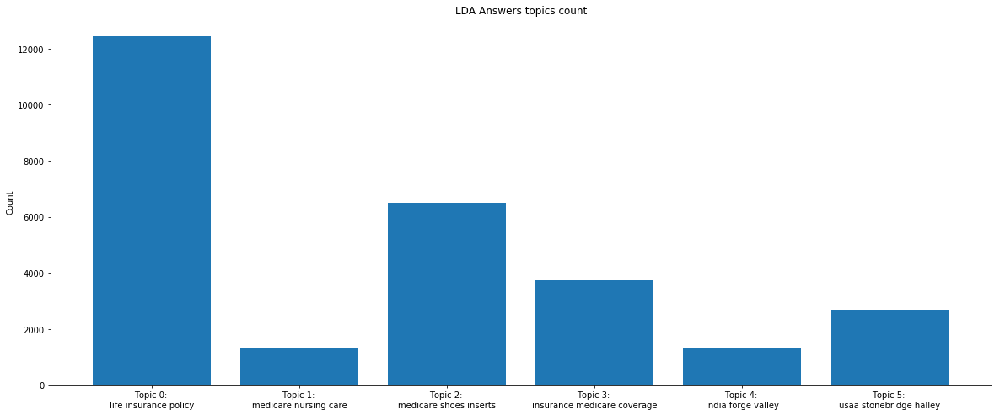

In [207]:
# Create lda topic matrix for anwers
lda_topic_matrix_a = create_model_lda_tsne(document_term_matrix_a)
# Get important terms per clusters + plots
lda_topics(lda_topic_matrix_a, document_term_matrix_a, tfidf_vectorizer_a, 'LDA Answers topics')

Topic 1:  insurance health cost
Topic 2:  term insurance long
Topic 3:  life insurance plan
Topic 4:  medicare insurance cover
Topic 5:  life insurance car
Topic 6:  insurance life need


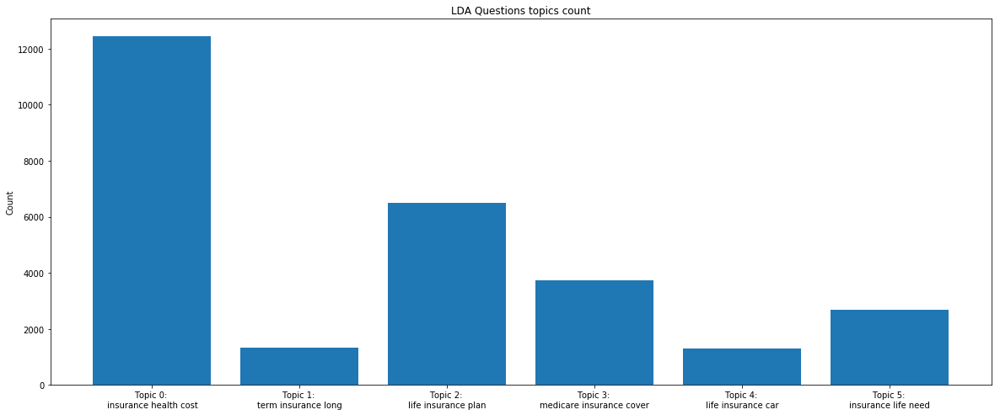

In [208]:
# Create lda topic matrix
lda_topic_matrix_q = create_model_lda_tsne(document_term_matrix_q)
# Get important terms per clusters + plots
lda_topics(lda_topic_matrix_q, document_term_matrix_q, tfidf_vectorizer_q, 'LDA Questions topics')

In [225]:
def create_model_lda_tsne(lda_topic_matrix):
    tsne_lda_model = TSNE(n_components = 2, perplexity = 50, learning_rate = 100, 
                        n_iter = 2000, verbose = 1, random_state = 0, angle = 0.75)
    tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)
    return tsne_lda_vectors

In [226]:
# Create tsne vectors for answers
tsne_lda_vectors_a = create_model_lda_tsne(lda_topic_matrix_a)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 27413 samples in 0.027s...
[t-SNE] Computed neighbors for 27413 samples in 0.965s...
[t-SNE] Computed conditional probabilities for sample 1000 / 27413
[t-SNE] Computed conditional probabilities for sample 2000 / 27413
[t-SNE] Computed conditional probabilities for sample 3000 / 27413
[t-SNE] Computed conditional probabilities for sample 4000 / 27413
[t-SNE] Computed conditional probabilities for sample 5000 / 27413
[t-SNE] Computed conditional probabilities for sample 6000 / 27413
[t-SNE] Computed conditional probabilities for sample 7000 / 27413
[t-SNE] Computed conditional probabilities for sample 8000 / 27413
[t-SNE] Computed conditional probabilities for sample 9000 / 27413
[t-SNE] Computed conditional probabilities for sample 10000 / 27413
[t-SNE] Computed conditional probabilities for sample 11000 / 27413
[t-SNE] Computed conditional probabilities for sample 12000 / 27413
[t-SNE] Computed conditional probabilities for sa

In [227]:
# Create tsne vectors for questions 
tsne_lda_vectors_q = create_model_lda_tsne(lda_topic_matrix_q)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 27987 samples in 0.014s...
[t-SNE] Computed neighbors for 27987 samples in 1.141s...
[t-SNE] Computed conditional probabilities for sample 1000 / 27987
[t-SNE] Computed conditional probabilities for sample 2000 / 27987
[t-SNE] Computed conditional probabilities for sample 3000 / 27987
[t-SNE] Computed conditional probabilities for sample 4000 / 27987
[t-SNE] Computed conditional probabilities for sample 5000 / 27987
[t-SNE] Computed conditional probabilities for sample 6000 / 27987
[t-SNE] Computed conditional probabilities for sample 7000 / 27987
[t-SNE] Computed conditional probabilities for sample 8000 / 27987
[t-SNE] Computed conditional probabilities for sample 9000 / 27987
[t-SNE] Computed conditional probabilities for sample 10000 / 27987
[t-SNE] Computed conditional probabilities for sample 11000 / 27987
[t-SNE] Computed conditional probabilities for sample 12000 / 27987
[t-SNE] Computed conditional probabilities for sa

In [229]:
cluster_bokeh_tsne(get_keys(lda_topic_matrix_a), document_term_matrix_a, tfidf_vectorizer_a, \
                   tsne_lda_vectors_a, 'Answers')

In [228]:
cluster_bokeh_tsne(get_keys(lda_topic_matrix_q), document_term_matrix_q, tfidf_vectorizer_q, \
                   tsne_lda_vectors_q, 'Questions')

Again! The clusters for Answers are by better than those for the answers. However, even though LDA is supposed to be more powerful than LSA we had better clusters with LSA so for the next analysis we will stick to LSA classifications.

## Cluster analysis using LSA values

In [265]:
 len(get_keys(lda_topic_matrix_a))

27413

In [266]:
len(l2a)

27413

In [269]:
l2q['lsa_classification'] = get_keys(lda_topic_matrix_q)
l2q.head()

,domain,questions_idx,groundTruth_labels_y,groundTruth_labels_x,questions_text,groundTruth_text,polarity,questions_text_no_stopWords,lsa_classification
0,medicare-insurance,"[idx_1285, idx_1010, idx_467, idx_47610, idx_1...",[16696],16696,What Does Medicare IME Stand For ?,According to the Centers for Medicare and Medi...,0.000,Medicare IME Stand ?,3
1,long-term-care-insurance,"[idx_3815, idx_604, idx_605, idx_891, idx_136,...",[10277],10277,Is Long Term Care Insurance Tax Free ?,"As a rule , if you buy a tax qualified long te...",0.175,Long Term Care Insurance Tax Free ?,5
2,health-insurance,"[idx_3019, idx_55039, idx_27647, idx_60975, id...",[12076],12076,Can Husband Drop Wife From Health Insurance ?,Can a spouse drop another spouse from health i...,0.000,Husband Drop Wife Health Insurance ?,4
3,medicare-insurance,"[idx_3815, idx_467, idx_34801, idx_1655, idx_7...","[25578, 6215]",25578,Is Medicare Run By The Government ?,Medicare Part A and Part B is provided by the ...,0.000,Medicare Run Government ?,3
4,medicare-insurance,"[idx_3815, idx_467, idx_34801, idx_1655, idx_7...","[25578, 6215]",6215,Is Medicare Run By The Government ?,Definitely . It is ran by the Center for Medic...,0.000,Medicare Run Government ?,3


In [302]:
domain_vs_cluster = l2q.groupby(['domain', 'lsa_classification']).count()[['questions_idx']].\
    rename(columns = {'questions_idx': 'count'}).sort_values('count', ascending = False) \
    .reset_index().drop_duplicates(subset='col2')

KeyError: Index(['col2'], dtype='object')

In [301]:
domain_vs_cluster.head(20)

count    2789
dtype: int64